# Designing model for Optic Fiber Network fault detection, localization, and identification

## Data Handling

Imports:

In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import torch
import torch.nn as nn
from torch.utils.data import TensorDataset, DataLoader
from tqdm import trange
import matplotlib.pyplot as plt
from sklearn.metrics import (roc_curve, auc,
                             precision_recall_curve,
                             confusion_matrix, classification_report,
                             mean_squared_error)
import seaborn as sns

In [2]:
import warnings
warnings.filterwarnings('ignore')

Data Loading:

In [3]:
data_dir = "../data/OTDR_DATA.csv"
data = pd.read_csv(data_dir)

In [4]:
data.head()

,Unnamed: 0,SNR,P1,P2,P3,P4,P5,P6,P7,P8,...,P25,P26,P27,P28,P29,P30,Class,Position,Reflectance,loss
0,70519,10.093627,0.989995,0.769634,0.866942,1.000000,0.838370,0.795462,0.801609,0.763259,...,0.345600,0.114946,0.000000,0.381516,0.099061,0.280784,1.0,0.08,0.0,0.112
1,81009,0.219347,0.341150,0.484929,0.689960,0.924820,0.648481,0.196055,0.886128,1.000000,...,0.384524,0.992029,0.488258,0.402361,0.321495,0.679280,3.0,0.11,0.0,0.400
2,62575,9.282432,0.438344,0.981339,0.728630,0.485106,0.359851,0.184697,0.222956,0.437243,...,0.910126,0.964232,0.637623,0.162285,0.138643,0.723457,0.0,0.00,0.0,0.000
3,70401,8.803449,0.674877,0.638932,0.651814,0.716335,0.475147,0.628348,0.626998,0.691957,...,0.411247,0.097255,0.210350,0.263302,0.132508,0.000000,1.0,0.09,0.0,0.100
4,7550,16.485467,0.767071,0.517559,0.115700,0.000000,0.055019,0.258061,0.115876,0.392273,...,0.457824,0.864551,0.704364,0.508301,0.433237,0.028219,0.0,0.00,0.0,0.000


In [5]:
print(list(data.columns))

['Unnamed: 0', 'SNR', 'P1', 'P2', 'P3', 'P4', 'P5', 'P6', 'P7', 'P8', 'P9', 'P10', 'P11', 'P12', 'P13', 'P14', 'P15', 'P16', 'P17', 'P18', 'P19', 'P20', 'P21', 'P22', 'P23', 'P24', 'P25', 'P26', 'P27', 'P28', 'P29', 'P30', 'Class', 'Position', 'Reflectance', 'loss']


In [6]:
counts = (
    data['Class']
      .value_counts()
      .reindex(range(8), fill_value=0)
      .sort_index()
)

print(counts)

Class
0    16048
1    16000
2    16000
3    16000
4    16000
5    13849
6    16000
7    15935
Name: count, dtype: int64


Even class distribution, with 8 classes (0-7).

In [7]:
data.drop(columns=["Unnamed: 0"], inplace=True)

In [8]:
import hvplot.pandas
data.hvplot.scatter(x='SNR', y='Position', c='Class', cmap='coolwarm',
                    title='SNR vs Position by Class', width=1200)

:Scatter   [SNR]   (Position,Class)

In [9]:
import hvplot.pandas
data.hvplot.scatter(x='Reflectance', y='Position', c='Class', cmap='coolwarm',
                    title='SNR vs Position by Class', width=1200)

:Scatter   [Reflectance]   (Position,Class)

In [10]:
import hvplot.pandas
data.hvplot.scatter(x='loss', y='Position', c='Class', cmap='coolwarm',
                    title='SNR vs Position by Class', width=1200)

:Scatter   [loss]   (Position,Class)

In [11]:
data.describe()

,SNR,P1,P2,P3,P4,P5,P6,P7,P8,P9,...,P25,P26,P27,P28,P29,P30,Class,Position,Reflectance,loss
count,125832.000000,125832.000000,125832.000000,125832.000000,125832.000000,125832.000000,125832.000000,125832.000000,125832.000000,125832.000000,...,125832.000000,125832.000000,125832.000000,125832.000000,125832.000000,125832.000000,125832.000000,125832.000000,125832.000000,125832.000000
mean,12.315957,0.383666,0.379560,0.377179,0.375738,0.376254,0.382815,0.390346,0.399960,0.412891,...,0.476285,0.456533,0.437593,0.420615,0.402363,0.389017,3.471216,0.059272,-0.070685,0.222031
std,9.202129,0.343306,0.338766,0.336568,0.332489,0.326922,0.324796,0.319550,0.315327,0.312780,...,0.296303,0.296518,0.294765,0.293194,0.295106,0.306531,2.302075,0.043066,0.092539,0.271161
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.300000,0.000000
25%,3.000000,0.041760,0.038821,0.036689,0.040424,0.051494,0.061802,0.079696,0.090327,0.103174,...,0.233595,0.215426,0.203007,0.192505,0.169732,0.144702,1.000000,0.030000,-0.130000,0.000000
50%,13.000000,0.320210,0.315812,0.310499,0.308350,0.313471,0.333092,0.351876,0.372897,0.397047,...,0.441615,0.416618,0.391529,0.366709,0.347401,0.332184,3.000000,0.060000,0.000000,0.092000
75%,20.106899,0.690142,0.685213,0.681227,0.669226,0.660253,0.662213,0.658540,0.664620,0.676426,...,0.714035,0.683525,0.656642,0.635709,0.617000,0.609878,6.000000,0.090000,0.000000,0.400000
max,30.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,7.000000,0.200000,0.000000,1.000000


In [12]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 125832 entries, 0 to 125831
Data columns (total 35 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   SNR          125832 non-null  float64
 1   P1           125832 non-null  float64
 2   P2           125832 non-null  float64
 3   P3           125832 non-null  float64
 4   P4           125832 non-null  float64
 5   P5           125832 non-null  float64
 6   P6           125832 non-null  float64
 7   P7           125832 non-null  float64
 8   P8           125832 non-null  float64
 9   P9           125832 non-null  float64
 10  P10          125832 non-null  float64
 11  P11          125832 non-null  float64
 12  P12          125832 non-null  float64
 13  P13          125832 non-null  float64
 14  P14          125832 non-null  float64
 15  P15          125832 non-null  float64
 16  P16          125832 non-null  float64
 17  P17          125832 non-null  float64
 18  P18          125832 non-

In [13]:
data.isnull().sum()

SNR            0
P1             0
P2             0
P3             0
P4             0
P5             0
P6             0
P7             0
P8             0
P9             0
P10            0
P11            0
P12            0
P13            0
P14            0
P15            0
P16            0
P17            0
P18            0
P19            0
P20            0
P21            0
P22            0
P23            0
P24            0
P25            0
P26            0
P27            0
P28            0
P29            0
P30            0
Class          0
Position       0
Reflectance    0
loss           0
dtype: int64

No null values found in the dataset.

In [14]:
print(data.shape)

(125832, 35)


In [15]:
train, test_data = train_test_split(data, test_size=0.2, random_state=42, stratify=data['Class'])

In [16]:
print(train.shape, test_data.shape)

(100665, 35) (25167, 35)


In [17]:
train_data, val_data = train_test_split(train, test_size=0.2, random_state=42, stratify=train['Class'])

In [18]:
print(train_data.shape, val_data.shape)

(80532, 35) (20133, 35)


In [19]:
print(test_data['Class'].value_counts().sort_index())

Class
0.0    3210
1.0    3200
2.0    3200
3.0    3200
4.0    3200
5.0    2770
6.0    3200
7.0    3187
Name: count, dtype: int64


In [20]:
print(train_data['Class'].value_counts().sort_index())

Class
0.0    10270
1.0    10240
2.0    10240
3.0    10240
4.0    10240
5.0     8863
6.0    10240
7.0    10199
Name: count, dtype: int64


In [21]:
print(val_data['Class'].value_counts().sort_index())

Class
0.0    2568
1.0    2560
2.0    2560
3.0    2560
4.0    2560
5.0    2216
6.0    2560
7.0    2549
Name: count, dtype: int64


### Setting up the data for training

In [22]:
measurement_cols = [c for c in data.columns
                    if c.startswith('P') and c[1:].isdigit()]
measurement_cols += ['SNR']
X_train = train_data[measurement_cols].values.astype(np.float32)                          # (N, 31)
Y_train_class = train_data['Class'].astype(np.int64).values                        # categorical fault label
Y_train_position = train_data['Position'].astype(np.float32).values.reshape(-1, 1)

In [23]:
print(measurement_cols)

['P1', 'P2', 'P3', 'P4', 'P5', 'P6', 'P7', 'P8', 'P9', 'P10', 'P11', 'P12', 'P13', 'P14', 'P15', 'P16', 'P17', 'P18', 'P19', 'P20', 'P21', 'P22', 'P23', 'P24', 'P25', 'P26', 'P27', 'P28', 'P29', 'P30', 'SNR']


In [24]:
X_val = val_data[measurement_cols].values.astype(np.float32)                          # (N, 31)
Y_val_class = val_data['Class'].astype(np.int64).values                        # categorical fault label
Y_val_position = val_data['Position'].astype(np.float32).values.reshape(-1, 1)

In [25]:
X_test = test_data[measurement_cols].values.astype(np.float32)                          # (N, 31)
Y_test_class = test_data['Class'].astype(np.int64).values                        # categorical fault label
Y_test_position = test_data['Position'].astype(np.float32).values.reshape(-1, 1)

In [26]:
print(X_train.shape, Y_train_class.shape, Y_train_position.shape)

(80532, 31) (80532,) (80532, 1)


In [27]:
print(X_val.shape, Y_val_class.shape, Y_val_position.shape)

(20133, 31) (20133,) (20133, 1)


In [28]:
print(X_test.shape, Y_test_class.shape, Y_test_position.shape)

(25167, 31) (25167,) (25167, 1)


In [29]:
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)     # fit ONLY on training data
X_val   = scaler.transform(X_val)           # transform validation
X_test  = scaler.transform(X_test)          # transform test

Making Tensors

In [30]:
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
X_val_tensor   = torch.tensor(X_val,   dtype=torch.float32)
X_test_tensor  = torch.tensor(X_test,  dtype=torch.float32)

y_class_train_tensor = torch.tensor(Y_train_class, dtype=torch.long)
y_class_val_tensor   = torch.tensor(Y_val_class,   dtype=torch.long)
y_class_test_tensor  = torch.tensor(Y_test_class,  dtype=torch.long)

y_pos_train_tensor = torch.tensor(Y_train_position, dtype=torch.float32)
y_pos_val_tensor   = torch.tensor(Y_val_position,   dtype=torch.float32)
y_pos_test_tensor  = torch.tensor(Y_test_position,  dtype=torch.float32)

## Model Functions

### GRU-AE

Checking CUDA:

In [31]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


In [32]:
print("PyTorch version:", torch.__version__)
print("Built with CUDA:", torch.version.cuda)
print("cuda.is_available():", torch.cuda.is_available())

PyTorch version: 2.5.1+cu121
Built with CUDA: 12.1
cuda.is_available(): True


Defining the GRU-AE and training it on normal traces:

In [33]:
NORMAL_LABEL = 0
idx_norm = (y_class_train_tensor == NORMAL_LABEL).nonzero(as_tuple=True)[0]

X_train_norm = X_train_tensor[idx_norm]           # shape (N_norm, 31)
train_loader_ae = DataLoader(X_train_norm, batch_size=256, shuffle=True, drop_last=True)

In [34]:
class VectorGRUAE(nn.Module):
    def __init__(self, feat_dim=31, hidden=128, latent=64, layers=5):
        super().__init__()
        self.encoder = nn.GRU(feat_dim, hidden, layers, batch_first=True, bidirectional=True)
        self.fc_mu  = nn.Linear(hidden, latent)
        self.fc_init= nn.Linear(latent, hidden*layers)
        self.decoder= nn.GRU(feat_dim, hidden, layers, batch_first=True)
        self.out    = nn.Linear(hidden, feat_dim)

    def forward(self, x):                # x (B, 1, 31)
        _, h_enc = self.encoder(x)
        z   = self.fc_mu(h_enc[-1])      # (B, latent)
        h0  = self.fc_init(z).view(self.decoder.num_layers, x.size(0), -1).contiguous()
        dec, _ = self.decoder(x, h0)
        return self.out(dec)

In [35]:
feat_dim = X_train_tensor.shape[1]
ae = VectorGRUAE(feat_dim=feat_dim, hidden=256, latent=128, layers=5).to(device)
opt = torch.optim.Adam(ae.parameters(), lr=1e-3)
loss_fn = nn.MSELoss()
scheduler = torch.optim.lr_scheduler.StepLR(opt, step_size=10, gamma=0.5)

best_val, patience, PAT_MAX = 1e9, 0, 10
# training loop
for epoch in range(120):
    ae.train(); tr_loss = 0
    for xb in train_loader_ae:
        xb = xb.unsqueeze(1).to(device)           # (B,1,31)
        loss = loss_fn(ae(xb), xb)
        opt.zero_grad(); loss.backward(); opt.step()
        tr_loss += loss.item()*xb.size(0)

    # quick validation
    ae.eval()
    with torch.no_grad():
        samp = X_val_tensor[:5000].unsqueeze(1).to(device)
        val_loss = loss_fn(ae(samp), samp).item()

    print(f'E{epoch:02d}  trainMSE={tr_loss/len(train_loader_ae.dataset):.5f} ' f'valMSE={val_loss:.5f}')
    scheduler.step()

    if val_loss < best_val:
        best_val, patience = val_loss, 0
        torch.save(ae.state_dict(), '../models/gru_ae_deep.pt')
    else:
        patience += 1
        if patience == PAT_MAX:
            print('Early stopping'); break

E00  trainMSE=0.60593 valMSE=0.49165
E01  trainMSE=0.42022 valMSE=0.33507
E02  trainMSE=0.36695 valMSE=0.26598
E03  trainMSE=0.32225 valMSE=0.22252
E04  trainMSE=0.26685 valMSE=0.15518
E05  trainMSE=0.18106 valMSE=0.09363
E06  trainMSE=0.09357 valMSE=0.03870
E07  trainMSE=0.03195 valMSE=0.01267
E08  trainMSE=0.00543 valMSE=0.00906
E09  trainMSE=0.00366 valMSE=0.00885
E10  trainMSE=0.00267 valMSE=0.00862
E11  trainMSE=0.00237 valMSE=0.00781
E12  trainMSE=0.00220 valMSE=0.00755
E13  trainMSE=0.00205 valMSE=0.00693
E14  trainMSE=0.00197 valMSE=0.00697
E15  trainMSE=0.00186 valMSE=0.00714
E16  trainMSE=0.00172 valMSE=0.00606
E17  trainMSE=0.00171 valMSE=0.00651
E18  trainMSE=0.00169 valMSE=0.00610
E19  trainMSE=0.00155 valMSE=0.00562
E20  trainMSE=0.00136 valMSE=0.00546
E21  trainMSE=0.00129 valMSE=0.00542
E22  trainMSE=0.00126 valMSE=0.00562
E23  trainMSE=0.00122 valMSE=0.00524
E24  trainMSE=0.00120 valMSE=0.00546
E25  trainMSE=0.00117 valMSE=0.00506
E26  trainMSE=0.00116 valMSE=0.00547
E

Evaluating GRU-AE:

GRU-AE Threshold: 0.003


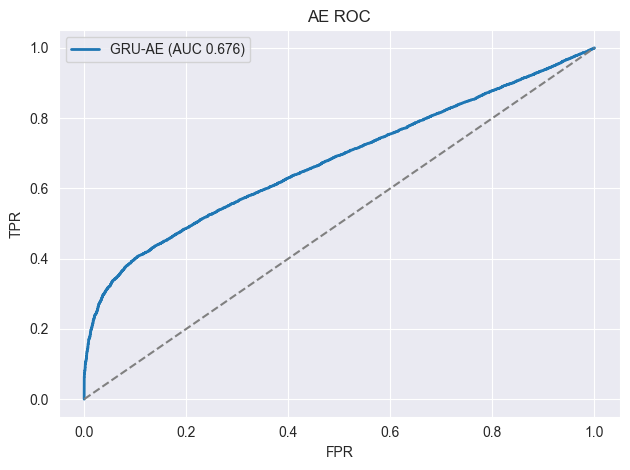

In [36]:
ae.load_state_dict(torch.load('../models/gru_ae_deep.pt', map_location=device, weights_only=True))

def recon_err_vec(model, data, bs=512):
    model.eval(); errs=[]
    with torch.no_grad():
        for i in range(0, data.size(0), bs):
            x = data[i:i+bs].unsqueeze(1).to(device)
            errs.append(((model(x)-x)**2).mean(dim=(1,2)).cpu())
    return torch.cat(errs)

err_train = recon_err_vec(ae, X_train_norm)
threshold = torch.quantile(err_train, 0.95).item()
print(f'GRU-AE Threshold: {threshold:.3f}')

err_eval  = recon_err_vec(ae, torch.cat([X_val_tensor, X_test_tensor]))
y_eval    = (torch.cat([y_class_val_tensor, y_class_test_tensor]) != 0).numpy()

from sklearn.metrics import roc_curve, auc
fpr, tpr, _ = roc_curve(y_eval, err_eval.numpy()); A = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, lw=2, label=f'GRU-AE (AUC {A:.3f})')
plt.plot([0,1],[0,1],'--', c='grey'); plt.legend()
plt.xlabel('FPR'); plt.ylabel('TPR'); plt.title('AE ROC'); plt.tight_layout()
plt.show()


Classification report:
               precision    recall  f1-score   support

      Normal       0.17      0.93      0.29      5778
     Anomaly       0.97      0.36      0.53     39522

    accuracy                           0.43     45300
   macro avg       0.57      0.64      0.41     45300
weighted avg       0.87      0.43      0.50     45300



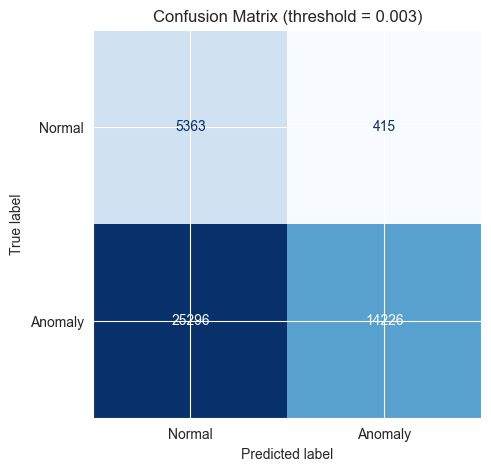

In [37]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report

y_pred = (err_eval.numpy() > threshold).astype(int)
y_true = y_eval.astype(int)

cm = confusion_matrix(y_true, y_pred)

print("\nClassification report:\n",
      classification_report(y_true, y_pred, target_names=['Normal','Anomaly']))

disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=['Normal','Anomaly'])
fig, ax = plt.subplots(figsize=(5,5))
disp.plot(ax=ax, cmap='Blues', colorbar=False)
ax.set_title(f'Confusion Matrix (threshold = {threshold:.3f})')
plt.tight_layout()
plt.show()


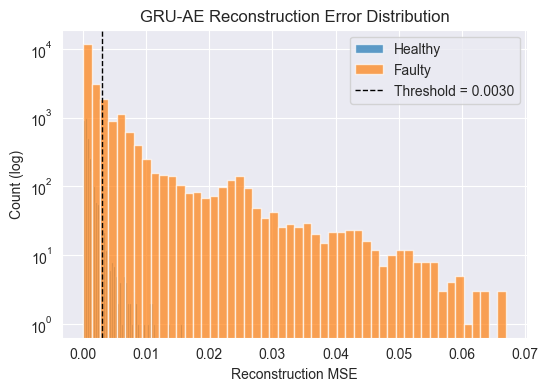

In [38]:
ae.eval()
test_ds  = TensorDataset(X_test_tensor,  y_class_test_tensor,  y_pos_test_tensor.squeeze(-1))
test_loader = DataLoader(test_ds, batch_size=256)
with torch.no_grad():
    recon_err = []
    for x in test_loader:
        x = x[0].to(device).unsqueeze(1)     # (B, 1, D)
        recon = ae(x)
        mse = (recon - x).pow(2).mean(dim=(1,2))  # per-sample error
        recon_err.append(mse.cpu())
recon_err = torch.cat(recon_err).numpy()

y_true_det = (y_class_test_tensor != NORMAL_LABEL).numpy().astype(int)  # 1 = fault, 0 = healthy
y_score_det = recon_err


plt.figure(figsize=(6,4))
plt.hist(recon_err[y_true_det==0], bins=50, alpha=0.7, label='Healthy')
plt.hist(recon_err[y_true_det==1], bins=50, alpha=0.7, label='Faulty')
plt.axvline(threshold, color='k', linestyle='--', linewidth=1,
            label=f'Threshold = {threshold:.4f}')
plt.yscale('log')
plt.xlabel('Reconstruction MSE'); plt.ylabel('Count (log)')
plt.title('GRU-AE Reconstruction Error Distribution')
plt.legend(); plt.show()


In [39]:
def reconstruction_errors_cond(batch_X, bs=512):
    amp_all, snr_all = batch_X[:, :30], batch_X[:, 30]
    errs = []
    ae.eval()
    with torch.no_grad():
        for i in range(0, batch_X.size(0), bs):
            amp = amp_all[i:i+bs].unsqueeze(-1).to(device)   # (B,30,1)
            snr = snr_all[i:i+bs].to(device)                # (B,)
            recon = ae(amp, snr)
            mse   = (recon - amp).pow(2).mean(dim=(1, 2))   # (B,)
            errs.append(mse.cpu())
    return torch.cat(errs)

def detect(batch_X, thresh=threshold):
    errs = reconstruction_errors_cond(batch_X)
    return errs > thresh

### TCN

TCN model definition:

In [40]:
class Chomp1d(nn.Module):
    def __init__(self, chomp):
        super().__init__(); self.chomp = chomp
    def forward(self, x):
        return x[:, :, :-self.chomp].contiguous()

class TemporalBlock(nn.Module):
    def __init__(self, in_ch, out_ch, k, d):
        super().__init__()
        pad = (k - 1) * d
        self.net = nn.Sequential(
            nn.Conv1d(in_ch, out_ch, k, padding=pad, dilation=d),
            Chomp1d(pad), nn.ReLU(),
            nn.Conv1d(out_ch, out_ch, k, padding=pad, dilation=d),
            Chomp1d(pad), nn.ReLU()
        )
        self.down = nn.Conv1d(in_ch, out_ch, 1) if in_ch != out_ch else nn.Identity()
        self.act = nn.ReLU()

    def forward(self, x):
        return self.act(self.net(x) + self.down(x))

class OTDR_TCN(nn.Module):
    def __init__(self, in_ch=1, mid_ch=64, n_blocks=5, k=3, n_classes=4):
        super().__init__()
        layers = []
        ch = in_ch
        for b in range(n_blocks):
            layers.append(TemporalBlock(ch, mid_ch, k, 2 ** b))
            ch = mid_ch
        self.tcn = nn.Sequential(*layers)
        self.gap = nn.AdaptiveAvgPool1d(1)      # global average over length

        # multitask heads
        self.class_head = nn.Linear(mid_ch, n_classes)
        self.loc_head   = nn.Linear(mid_ch, 1)

    def forward(self, x):            # x: (B, 1, L)
        h = self.tcn(x)
        h = self.gap(h).squeeze(-1)  # (B, mid_ch)
        return self.class_head(h), self.loc_head(h).squeeze(-1)

In [41]:
batch_size = 256

train_ds = TensorDataset(X_train_tensor, y_class_train_tensor, y_pos_train_tensor.squeeze(-1))
val_ds   = TensorDataset(X_val_tensor,   y_class_val_tensor,   y_pos_val_tensor.squeeze(-1))
test_ds  = TensorDataset(X_test_tensor,  y_class_test_tensor,  y_pos_test_tensor.squeeze(-1))

train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=True, drop_last=True)
val_loader   = DataLoader(val_ds,   batch_size=batch_size)

Training the TCN model:

In [42]:
n_fault_classes = int(y_class_train_tensor.max() + 1)

tcn = OTDR_TCN(in_ch=1,
               mid_ch=64,
               n_blocks=6,
               k=3,
               n_classes=n_fault_classes).to(device)

criterion_cls = nn.CrossEntropyLoss()
criterion_loc = nn.MSELoss()
lambda_loc = 0.5                              # scale for regression term

opt_tcn = torch.optim.Adam(tcn.parameters(), lr=1e-3)


In [43]:
num_epochs_tcn = 50
best_val_loss, patience, patience_max = float('inf'), 0, 10

for epoch in trange(num_epochs_tcn, desc='TCN'):
    # training loop
    tcn.train()
    t_loss = 0.
    for x, y_cls, y_loc in train_loader:
        x   = x.unsqueeze(1).to(device)         # (B, 1, L)
        y_c = y_cls.to(device)
        y_l = y_loc.to(device)

        logits, pred_loc = tcn(x)
        loss = criterion_cls(logits, y_c) + lambda_loc * criterion_loc(pred_loc, y_l)
        opt_tcn.zero_grad()
        loss.backward()
        nn.utils.clip_grad_norm_(tcn.parameters(), 1.0)
        opt_tcn.step()
        t_loss += loss.item() * x.size(0)

    # validation loop
    tcn.eval()
    v_loss, v_correct, v_samples, v_mse_sum = 0., 0, 0, 0.
    with torch.no_grad():
        for x, y_cls, y_loc in val_loader:
            x   = x.unsqueeze(1).to(device)
            y_c = y_cls.to(device)
            y_l = y_loc.to(device)

            logits, pred_loc = tcn(x)
            loss = criterion_cls(logits, y_c) + lambda_loc * criterion_loc(pred_loc, y_l)
            v_loss += loss.item() * x.size(0)

            v_correct += (logits.argmax(1) == y_c).sum().item()
            v_mse_sum += criterion_loc(pred_loc, y_l).item() * x.size(0)
            v_samples += x.size(0)

    v_loss /= v_samples
    v_acc  = v_correct / v_samples
    v_rmse = (v_mse_sum / v_samples) ** 0.5

    print(f'Epoch {epoch+1:02d} | train L={t_loss/len(train_ds):.4f} | '
          f'val L={v_loss:.4f} | val Acc={v_acc:.3f} | val RMSE={v_rmse:.3f}')

    # ---- early stopping ----
    if v_loss < best_val_loss:
        best_val_loss = v_loss
        torch.save(tcn.state_dict(), '../models/best_tcn.pt')
        patience = 0
    else:
        patience += 1
        if patience >= patience_max:
            print('Early stopping.')
            break


TCN:   2%|▏         | 1/50 [00:05<04:20,  5.31s/it]

Epoch 01 | train L=1.1138 | val L=0.8748 | val Acc=0.661 | val RMSE=0.055


TCN:   4%|▍         | 2/50 [00:10<03:59,  4.99s/it]

Epoch 02 | train L=0.8383 | val L=0.7998 | val Acc=0.690 | val RMSE=0.167


TCN:   6%|▌         | 3/50 [00:14<03:39,  4.67s/it]

Epoch 03 | train L=0.7443 | val L=0.7118 | val Acc=0.725 | val RMSE=0.058


TCN:   8%|▊         | 4/50 [00:18<03:29,  4.55s/it]

Epoch 04 | train L=0.6129 | val L=0.5224 | val Acc=0.798 | val RMSE=0.089


TCN:  10%|█         | 5/50 [00:23<03:22,  4.50s/it]

Epoch 05 | train L=0.4776 | val L=0.4459 | val Acc=0.831 | val RMSE=0.172


TCN:  12%|█▏        | 6/50 [00:27<03:15,  4.45s/it]

Epoch 06 | train L=0.4281 | val L=0.4044 | val Acc=0.841 | val RMSE=0.169


TCN:  14%|█▍        | 7/50 [00:31<03:11,  4.44s/it]

Epoch 07 | train L=0.4076 | val L=0.4089 | val Acc=0.833 | val RMSE=0.065


TCN:  16%|█▌        | 8/50 [00:36<03:09,  4.52s/it]

Epoch 08 | train L=0.3897 | val L=0.3745 | val Acc=0.845 | val RMSE=0.061


TCN:  18%|█▊        | 9/50 [00:46<04:12,  6.16s/it]

Epoch 09 | train L=0.3747 | val L=0.3795 | val Acc=0.845 | val RMSE=0.059


TCN:  20%|██        | 10/50 [00:52<04:01,  6.03s/it]

Epoch 10 | train L=0.3703 | val L=0.3806 | val Acc=0.847 | val RMSE=0.109


TCN:  22%|██▏       | 11/50 [00:56<03:35,  5.53s/it]

Epoch 11 | train L=0.3514 | val L=0.3697 | val Acc=0.846 | val RMSE=0.054


TCN:  24%|██▍       | 12/50 [01:00<03:16,  5.16s/it]

Epoch 12 | train L=0.3497 | val L=0.4053 | val Acc=0.841 | val RMSE=0.074


TCN:  26%|██▌       | 13/50 [01:05<03:00,  4.88s/it]

Epoch 13 | train L=0.3397 | val L=0.3415 | val Acc=0.864 | val RMSE=0.120


TCN:  28%|██▊       | 14/50 [01:09<02:48,  4.69s/it]

Epoch 14 | train L=0.3348 | val L=0.3299 | val Acc=0.863 | val RMSE=0.065


TCN:  30%|███       | 15/50 [01:13<02:41,  4.62s/it]

Epoch 15 | train L=0.3244 | val L=0.3550 | val Acc=0.857 | val RMSE=0.073


TCN:  32%|███▏      | 16/50 [01:18<02:34,  4.55s/it]

Epoch 16 | train L=0.3165 | val L=0.3220 | val Acc=0.866 | val RMSE=0.065


TCN:  34%|███▍      | 17/50 [01:22<02:27,  4.48s/it]

Epoch 17 | train L=0.3104 | val L=0.3180 | val Acc=0.867 | val RMSE=0.064


TCN:  36%|███▌      | 18/50 [01:26<02:21,  4.43s/it]

Epoch 18 | train L=0.3032 | val L=0.3313 | val Acc=0.862 | val RMSE=0.059


TCN:  38%|███▊      | 19/50 [01:31<02:16,  4.41s/it]

Epoch 19 | train L=0.2999 | val L=0.3204 | val Acc=0.867 | val RMSE=0.054


TCN:  40%|████      | 20/50 [01:35<02:11,  4.38s/it]

Epoch 20 | train L=0.2938 | val L=0.3340 | val Acc=0.866 | val RMSE=0.067


TCN:  42%|████▏     | 21/50 [01:39<02:07,  4.39s/it]

Epoch 21 | train L=0.2833 | val L=0.3113 | val Acc=0.872 | val RMSE=0.053


TCN:  44%|████▍     | 22/50 [01:44<02:01,  4.33s/it]

Epoch 22 | train L=0.2813 | val L=0.3322 | val Acc=0.867 | val RMSE=0.062


TCN:  46%|████▌     | 23/50 [01:48<01:56,  4.32s/it]

Epoch 23 | train L=0.2806 | val L=0.3136 | val Acc=0.872 | val RMSE=0.049


TCN:  48%|████▊     | 24/50 [01:52<01:52,  4.31s/it]

Epoch 24 | train L=0.2690 | val L=0.3158 | val Acc=0.869 | val RMSE=0.047


TCN:  50%|█████     | 25/50 [01:56<01:47,  4.31s/it]

Epoch 25 | train L=0.2667 | val L=0.3010 | val Acc=0.879 | val RMSE=0.086


TCN:  52%|█████▏    | 26/50 [02:01<01:43,  4.30s/it]

Epoch 26 | train L=0.2564 | val L=0.2998 | val Acc=0.877 | val RMSE=0.046


TCN:  54%|█████▍    | 27/50 [02:05<01:38,  4.30s/it]

Epoch 27 | train L=0.2557 | val L=0.2998 | val Acc=0.880 | val RMSE=0.059


TCN:  56%|█████▌    | 28/50 [02:09<01:35,  4.33s/it]

Epoch 28 | train L=0.2478 | val L=0.3019 | val Acc=0.881 | val RMSE=0.060


TCN:  58%|█████▊    | 29/50 [02:14<01:29,  4.28s/it]

Epoch 29 | train L=0.2465 | val L=0.3019 | val Acc=0.881 | val RMSE=0.044


TCN:  60%|██████    | 30/50 [02:18<01:25,  4.27s/it]

Epoch 30 | train L=0.2400 | val L=0.2953 | val Acc=0.881 | val RMSE=0.044


TCN:  62%|██████▏   | 31/50 [02:22<01:20,  4.26s/it]

Epoch 31 | train L=0.2360 | val L=0.3040 | val Acc=0.879 | val RMSE=0.059


TCN:  64%|██████▍   | 32/50 [02:26<01:16,  4.27s/it]

Epoch 32 | train L=0.2287 | val L=0.3062 | val Acc=0.880 | val RMSE=0.050


TCN:  66%|██████▌   | 33/50 [02:31<01:12,  4.27s/it]

Epoch 33 | train L=0.2245 | val L=0.3153 | val Acc=0.879 | val RMSE=0.041


TCN:  68%|██████▊   | 34/50 [02:35<01:09,  4.33s/it]

Epoch 34 | train L=0.2154 | val L=0.2959 | val Acc=0.882 | val RMSE=0.043


TCN:  70%|███████   | 35/50 [02:39<01:04,  4.31s/it]

Epoch 35 | train L=0.2113 | val L=0.3072 | val Acc=0.879 | val RMSE=0.045


TCN:  72%|███████▏  | 36/50 [02:44<00:59,  4.27s/it]

Epoch 36 | train L=0.2040 | val L=0.3074 | val Acc=0.885 | val RMSE=0.050


TCN:  74%|███████▍  | 37/50 [02:48<00:55,  4.24s/it]

Epoch 37 | train L=0.2044 | val L=0.2975 | val Acc=0.884 | val RMSE=0.038


TCN:  76%|███████▌  | 38/50 [02:52<00:50,  4.23s/it]

Epoch 38 | train L=0.1949 | val L=0.3014 | val Acc=0.888 | val RMSE=0.035


TCN:  78%|███████▊  | 39/50 [02:56<00:46,  4.25s/it]

Epoch 39 | train L=0.1880 | val L=0.2998 | val Acc=0.885 | val RMSE=0.039


TCN:  78%|███████▊  | 39/50 [03:01<00:51,  4.65s/it]

Epoch 40 | train L=0.1810 | val L=0.3059 | val Acc=0.889 | val RMSE=0.065
Early stopping.


Evaluating the TCN model on the test set:

In [44]:
tcn.load_state_dict(torch.load('../models/best_tcn.pt', map_location=device, weights_only=True))
tcn.eval()

test_loader = DataLoader(test_ds, batch_size=batch_size)

test_correct, test_samples, test_mse_sum = 0, 0, 0.
with torch.no_grad():
    for x, y_cls, y_loc in test_loader:
        x   = x.unsqueeze(1).to(device)
        y_c = y_cls.to(device)
        y_l = y_loc.to(device)

        logits, pred_loc = tcn(x)
        test_correct += (logits.argmax(1) == y_c).sum().item()
        test_mse_sum  += criterion_loc(pred_loc, y_l).item() * x.size(0)
        test_samples  += x.size(0)

test_acc  = test_correct / test_samples
test_rmse = (test_mse_sum / test_samples) ** 0.5
print(f'Test Acc = {test_acc:.3f} | Test RMSE = {test_rmse:.3f}')


Test Acc = 0.885 | Test RMSE = 0.044


## Evaluation

TCN Evaluation:

In [45]:
tcn.eval()
all_preds_cls, all_true_cls = [], []
all_preds_loc, all_true_loc = [], []

with torch.no_grad():
    for x, y_cls, y_loc in test_loader:
        x = x.unsqueeze(1).to(device)
        logits, pred_loc = tcn(x)
        all_preds_cls.append(logits.argmax(1).cpu())
        all_preds_loc.append(pred_loc.cpu())
        all_true_cls.append(y_cls)
        all_true_loc.append(y_loc)

all_preds_cls = torch.cat(all_preds_cls).numpy()
all_true_cls  = torch.cat(all_true_cls ).numpy()
all_preds_loc = torch.cat(all_preds_loc).numpy()
all_true_loc  = torch.cat(all_true_loc ).numpy()


In [46]:
cm = confusion_matrix(all_true_cls, all_preds_cls)
class_report = classification_report(all_true_cls, all_preds_cls, digits=3)
print(class_report)

              precision    recall  f1-score   support

           0      0.846     0.788     0.816      3210
           1      0.955     0.943     0.949      3200
           2      0.824     0.867     0.845      3200
           3      0.897     0.942     0.919      3200
           4      0.945     0.890     0.917      3200
           5      0.810     0.824     0.817      2770
           6      0.969     0.858     0.910      3200
           7      0.848     0.965     0.903      3187

    accuracy                          0.885     25167
   macro avg      0.887     0.885     0.884     25167
weighted avg      0.888     0.885     0.885     25167



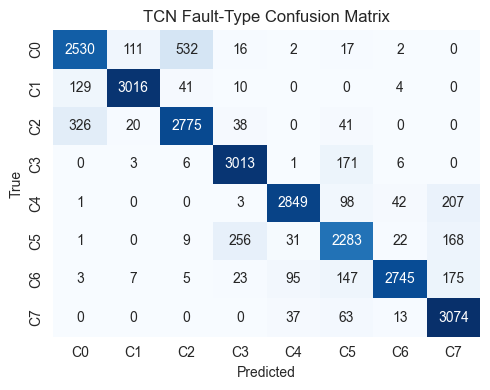

In [47]:
plt.figure(figsize=(5,4))
sns.heatmap(cm,
            annot=True, fmt='d',
            cmap='Blues',
            cbar=False,
            xticklabels=[f'C{i}' for i in range(cm.shape[0])],
            yticklabels=[f'C{i}' for i in range(cm.shape[0])])
plt.xlabel('Predicted'); plt.ylabel('True')
plt.title('TCN Fault-Type Confusion Matrix'); plt.tight_layout(); plt.show()

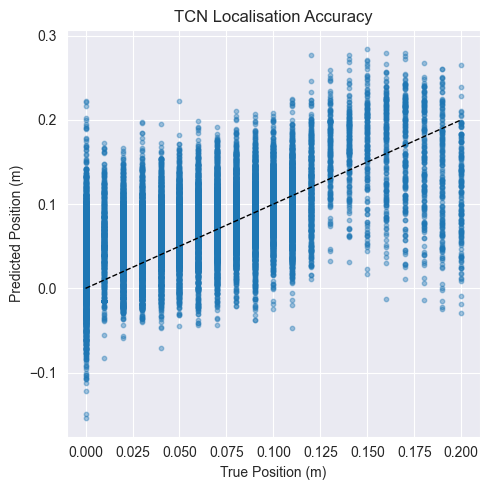

In [48]:
import torch
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

seq_len = X_test_tensor.shape[1]           # 31
n_classes = 8                              # healthy + 7 faults
tcn = OTDR_TCN(in_ch=1,
               mid_ch=64,
               n_blocks=6,
               k=3,
               n_classes=n_classes).to(device)
tcn.load_state_dict(torch.load('../models/best_tcn.pt', map_location=device, weights_only=True))
tcn.eval()

test_loader = DataLoader(
    TensorDataset(X_test_tensor, y_pos_test_tensor.squeeze(-1)),
    batch_size=256
)

all_preds_loc, all_true_loc = [], []
with torch.no_grad():
    for xb, yb in test_loader:
        # TCN expects (B, 1, L)
        _, loc_hat = tcn(xb.unsqueeze(1).to(device))
        all_preds_loc.append(loc_hat.cpu())
        all_true_loc.append(yb)

all_preds_loc = torch.cat(all_preds_loc).numpy()
all_true_loc  = torch.cat(all_true_loc).numpy()


plt.figure(figsize=(5, 5))
plt.scatter(all_true_loc, all_preds_loc, alpha=0.4, s=10)
lims = [all_true_loc.min(), all_true_loc.max()]
plt.plot(lims, lims, 'k--', linewidth=1)
plt.xlabel('True Position (m)')
plt.ylabel('Predicted Position (m)')
plt.title('TCN Localisation Accuracy')
plt.grid(True)
plt.tight_layout()
plt.show()


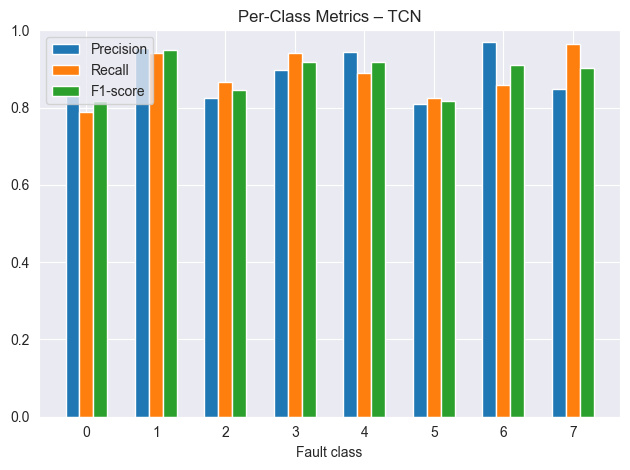

In [49]:
from sklearn.metrics import classification_report, confusion_matrix, precision_recall_fscore_support


# bar chart of precision, recall, F1
prec, rec, f1, _ = precision_recall_fscore_support(all_true_cls, all_preds_cls, zero_division=0)
x = np.arange(n_fault_classes)
plt.figure()
plt.bar(x-0.2, prec, width=0.2, label='Precision')
plt.bar(x,     rec,  width=0.2, label='Recall')
plt.bar(x+0.2, f1,   width=0.2, label='F1-score')
plt.xticks(x)
plt.xlabel('Fault class')
plt.ylim(0, 1)
plt.title('Per-Class Metrics – TCN')
plt.legend()
plt.tight_layout()
plt.show()


## Time Series Transformer Model

In [50]:
class TimeSeriesTransformer(nn.Module):
    def __init__(self, seq_len=31, d_model=128, n_heads=4, n_layers=4,
                 dim_feedforward=256, dropout=0.1, n_classes=4):
        super().__init__()
        self.seq_len = seq_len
        # scalar amplitude → d_model
        self.input_proj = nn.Linear(1, d_model)

        # learnable positional encodings
        self.pos_embed = nn.Parameter(torch.randn(seq_len, d_model))

        # vanilla encoder stack
        enc_layer = nn.TransformerEncoderLayer(d_model=d_model,
                                               nhead=n_heads,
                                               dim_feedforward=dim_feedforward,
                                               dropout=dropout,
                                               batch_first=True)
        self.encoder = nn.TransformerEncoder(enc_layer, num_layers=n_layers)

        # task heads
        self.cls_head = nn.Linear(d_model, n_classes)
        self.loc_head = nn.Linear(d_model, 1)

        # initialisation (Xavier)
        for m in self.modules():
            if isinstance(m, (nn.Linear, nn.Conv1d)):
                nn.init.xavier_uniform_(m.weight)
                if m.bias is not None:
                    nn.init.zeros_(m.bias)

    def forward(self, x):
        if x.dim() == 3:           # (B, 1, L)
            x = x.squeeze(1)
        B, L = x.shape             # expect L == seq_len
        x = x.unsqueeze(-1)        # (B, L, 1)
        h = self.input_proj(x)     # (B, L, d_model)
        h = h + self.pos_embed[None, :, :]  # add positional enc.

        h = self.encoder(h)        # (B, L, d_model)
        h = h.mean(dim=1)          # global average pooling

        return self.cls_head(h), self.loc_head(h).squeeze(-1)


Transformer training:

In [51]:
seq_len        = X_train_tensor.shape[1]          # 31
n_fault_classes = int(y_class_train_tensor.max() + 1)

tst = TimeSeriesTransformer(seq_len=seq_len,
                            d_model=128,
                            n_heads=4,
                            n_layers=4,
                            dim_feedforward=256,
                            dropout=0.1,
                            n_classes=n_fault_classes).to(device)

criterion_cls = nn.CrossEntropyLoss()
criterion_loc = nn.MSELoss()
lambda_loc    = 0.5                     # weight for regression term

opt_tst = torch.optim.AdamW(tst.parameters(), lr=2e-4, weight_decay=1e-2)

sch_tst = torch.optim.lr_scheduler.StepLR(opt_tst, step_size=15, gamma=0.5)


In [52]:
n_epochs_tst   = 60
best_val_loss  = float('inf')
patience, pat_max = 0, 10

for epoch in trange(n_epochs_tst, desc='TST'):
    # training loop
    tst.train()
    tr_loss = 0.
    for x, y_cls, y_loc in train_loader:
        x   = x.to(device)
        y_c = y_cls.to(device)
        y_l = y_loc.to(device)

        logits, p_loc = tst(x)
        loss = criterion_cls(logits, y_c) + lambda_loc * criterion_loc(p_loc, y_l)

        opt_tst.zero_grad()
        loss.backward()
        nn.utils.clip_grad_norm_(tst.parameters(), 1.0)
        opt_tst.step()
        tr_loss += loss.item() * x.size(0)

    # validation
    tst.eval()
    val_loss, val_corr, val_samp, val_mse = 0., 0, 0, 0.
    with torch.no_grad():
        for x, y_cls, y_loc in val_loader:
            x, y_c, y_l = x.to(device), y_cls.to(device), y_loc.to(device)
            logits, p_loc = tst(x)
            loss = criterion_cls(logits, y_c) + lambda_loc * criterion_loc(p_loc, y_l)

            val_loss += loss.item() * x.size(0)
            val_corr += (logits.argmax(1) == y_c).sum().item()
            val_mse  += criterion_loc(p_loc, y_l).item() * x.size(0)
            val_samp += x.size(0)

    val_loss /= val_samp
    val_acc   = val_corr / val_samp
    val_rmse  = (val_mse / val_samp) ** 0.5

    print(f'Epoch {epoch+1:02d} | trL={tr_loss/len(train_ds):.4f} | '
          f'valL={val_loss:.4f} | valAcc={val_acc:.3f} | valRMSE={val_rmse:.3f}')

    sch_tst.step()
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(tst.state_dict(), '../models/best_tst.pt')
        patience = 0
    else:
        patience += 1
        if patience >= pat_max:
            print('Early stopping.')
            break


TST:   2%|▏         | 1/60 [00:05<05:28,  5.57s/it]

Epoch 01 | trL=1.0604 | valL=0.6099 | valAcc=0.768 | valRMSE=0.078


TST:   3%|▎         | 2/60 [00:10<05:12,  5.39s/it]

Epoch 02 | trL=0.5723 | valL=0.4886 | valAcc=0.803 | valRMSE=0.064


TST:   5%|▌         | 3/60 [00:16<05:06,  5.38s/it]

Epoch 03 | trL=0.4885 | valL=0.4280 | valAcc=0.821 | valRMSE=0.062


TST:   7%|▋         | 4/60 [00:21<05:01,  5.39s/it]

Epoch 04 | trL=0.4523 | valL=0.4109 | valAcc=0.829 | valRMSE=0.045


TST:   8%|▊         | 5/60 [00:27<04:58,  5.43s/it]

Epoch 05 | trL=0.4266 | valL=0.3976 | valAcc=0.832 | valRMSE=0.046


TST:  10%|█         | 6/60 [00:32<04:51,  5.40s/it]

Epoch 06 | trL=0.4082 | valL=0.3980 | valAcc=0.834 | valRMSE=0.052


TST:  12%|█▏        | 7/60 [00:37<04:44,  5.37s/it]

Epoch 07 | trL=0.3982 | valL=0.3676 | valAcc=0.844 | valRMSE=0.052


TST:  13%|█▎        | 8/60 [00:43<04:38,  5.36s/it]

Epoch 08 | trL=0.3821 | valL=0.3551 | valAcc=0.849 | valRMSE=0.040


TST:  15%|█▌        | 9/60 [00:48<04:33,  5.35s/it]

Epoch 09 | trL=0.3723 | valL=0.3718 | valAcc=0.840 | valRMSE=0.041


TST:  17%|█▋        | 10/60 [00:53<04:27,  5.36s/it]

Epoch 10 | trL=0.3663 | valL=0.3410 | valAcc=0.851 | valRMSE=0.037


TST:  18%|█▊        | 11/60 [00:59<04:26,  5.44s/it]

Epoch 11 | trL=0.3609 | valL=0.3518 | valAcc=0.851 | valRMSE=0.036


TST:  20%|██        | 12/60 [01:05<04:28,  5.59s/it]

Epoch 12 | trL=0.3542 | valL=0.3466 | valAcc=0.854 | valRMSE=0.036


TST:  22%|██▏       | 13/60 [01:10<04:18,  5.51s/it]

Epoch 13 | trL=0.3512 | valL=0.3455 | valAcc=0.853 | valRMSE=0.035


TST:  23%|██▎       | 14/60 [01:16<04:11,  5.47s/it]

Epoch 14 | trL=0.3432 | valL=0.3406 | valAcc=0.857 | valRMSE=0.036


TST:  25%|██▌       | 15/60 [01:21<04:03,  5.41s/it]

Epoch 15 | trL=0.3378 | valL=0.3322 | valAcc=0.858 | valRMSE=0.034


TST:  27%|██▋       | 16/60 [01:26<03:57,  5.41s/it]

Epoch 16 | trL=0.3203 | valL=0.3215 | valAcc=0.863 | valRMSE=0.034


TST:  28%|██▊       | 17/60 [01:32<03:52,  5.41s/it]

Epoch 17 | trL=0.3172 | valL=0.3288 | valAcc=0.861 | valRMSE=0.034


TST:  30%|███       | 18/60 [01:37<03:48,  5.45s/it]

Epoch 18 | trL=0.3136 | valL=0.3207 | valAcc=0.865 | valRMSE=0.032


TST:  32%|███▏      | 19/60 [01:43<03:42,  5.43s/it]

Epoch 19 | trL=0.3144 | valL=0.3194 | valAcc=0.861 | valRMSE=0.032


TST:  33%|███▎      | 20/60 [01:48<03:36,  5.40s/it]

Epoch 20 | trL=0.3105 | valL=0.3110 | valAcc=0.868 | valRMSE=0.033


TST:  35%|███▌      | 21/60 [01:53<03:30,  5.40s/it]

Epoch 21 | trL=0.3076 | valL=0.3202 | valAcc=0.865 | valRMSE=0.032


TST:  37%|███▋      | 22/60 [01:59<03:23,  5.37s/it]

Epoch 22 | trL=0.3064 | valL=0.3175 | valAcc=0.864 | valRMSE=0.031


TST:  38%|███▊      | 23/60 [02:04<03:21,  5.43s/it]

Epoch 23 | trL=0.3057 | valL=0.3183 | valAcc=0.864 | valRMSE=0.033


TST:  40%|████      | 24/60 [02:10<03:16,  5.45s/it]

Epoch 24 | trL=0.3027 | valL=0.3114 | valAcc=0.868 | valRMSE=0.031


TST:  42%|████▏     | 25/60 [02:15<03:09,  5.41s/it]

Epoch 25 | trL=0.3015 | valL=0.3153 | valAcc=0.867 | valRMSE=0.031


TST:  43%|████▎     | 26/60 [02:20<03:02,  5.37s/it]

Epoch 26 | trL=0.2996 | valL=0.3019 | valAcc=0.872 | valRMSE=0.031


TST:  45%|████▌     | 27/60 [02:26<02:57,  5.39s/it]

Epoch 27 | trL=0.2995 | valL=0.2999 | valAcc=0.873 | valRMSE=0.030


TST:  47%|████▋     | 28/60 [02:32<02:57,  5.56s/it]

Epoch 28 | trL=0.2957 | valL=0.3191 | valAcc=0.867 | valRMSE=0.030


TST:  48%|████▊     | 29/60 [02:38<02:56,  5.68s/it]

Epoch 29 | trL=0.2965 | valL=0.3111 | valAcc=0.868 | valRMSE=0.032


TST:  50%|█████     | 30/60 [02:44<03:00,  6.01s/it]

Epoch 30 | trL=0.2929 | valL=0.3066 | valAcc=0.872 | valRMSE=0.032


TST:  52%|█████▏    | 31/60 [02:51<02:59,  6.19s/it]

Epoch 31 | trL=0.2858 | valL=0.3009 | valAcc=0.874 | valRMSE=0.030


TST:  53%|█████▎    | 32/60 [02:57<02:50,  6.09s/it]

Epoch 32 | trL=0.2832 | valL=0.3005 | valAcc=0.872 | valRMSE=0.030


TST:  55%|█████▌    | 33/60 [03:02<02:38,  5.85s/it]

Epoch 33 | trL=0.2833 | valL=0.3023 | valAcc=0.874 | valRMSE=0.030


TST:  57%|█████▋    | 34/60 [03:08<02:28,  5.70s/it]

Epoch 34 | trL=0.2830 | valL=0.3029 | valAcc=0.871 | valRMSE=0.029


TST:  58%|█████▊    | 35/60 [03:13<02:20,  5.60s/it]

Epoch 35 | trL=0.2811 | valL=0.2963 | valAcc=0.875 | valRMSE=0.029


TST:  60%|██████    | 36/60 [03:18<02:12,  5.51s/it]

Epoch 36 | trL=0.2805 | valL=0.3015 | valAcc=0.872 | valRMSE=0.030


TST:  62%|██████▏   | 37/60 [03:24<02:06,  5.49s/it]

Epoch 37 | trL=0.2808 | valL=0.2949 | valAcc=0.877 | valRMSE=0.030


TST:  63%|██████▎   | 38/60 [03:29<01:59,  5.45s/it]

Epoch 38 | trL=0.2781 | valL=0.2946 | valAcc=0.877 | valRMSE=0.029


TST:  65%|██████▌   | 39/60 [03:34<01:54,  5.44s/it]

Epoch 39 | trL=0.2769 | valL=0.2984 | valAcc=0.876 | valRMSE=0.030


TST:  67%|██████▋   | 40/60 [03:40<01:47,  5.39s/it]

Epoch 40 | trL=0.2788 | valL=0.3042 | valAcc=0.872 | valRMSE=0.030


TST:  68%|██████▊   | 41/60 [03:45<01:41,  5.36s/it]

Epoch 41 | trL=0.2761 | valL=0.2948 | valAcc=0.877 | valRMSE=0.029


TST:  70%|███████   | 42/60 [03:50<01:36,  5.37s/it]

Epoch 42 | trL=0.2767 | valL=0.3018 | valAcc=0.873 | valRMSE=0.030


TST:  72%|███████▏  | 43/60 [03:56<01:30,  5.35s/it]

Epoch 43 | trL=0.2753 | valL=0.3001 | valAcc=0.875 | valRMSE=0.030


TST:  73%|███████▎  | 44/60 [04:01<01:26,  5.41s/it]

Epoch 44 | trL=0.2733 | valL=0.2942 | valAcc=0.878 | valRMSE=0.029


TST:  75%|███████▌  | 45/60 [04:07<01:21,  5.40s/it]

Epoch 45 | trL=0.2732 | valL=0.2921 | valAcc=0.878 | valRMSE=0.029


TST:  77%|███████▋  | 46/60 [04:12<01:15,  5.38s/it]

Epoch 46 | trL=0.2681 | valL=0.2913 | valAcc=0.879 | valRMSE=0.029


TST:  78%|███████▊  | 47/60 [04:17<01:09,  5.37s/it]

Epoch 47 | trL=0.2689 | valL=0.2968 | valAcc=0.877 | valRMSE=0.029


TST:  80%|████████  | 48/60 [04:23<01:04,  5.35s/it]

Epoch 48 | trL=0.2668 | valL=0.2921 | valAcc=0.879 | valRMSE=0.029


TST:  82%|████████▏ | 49/60 [04:28<00:58,  5.35s/it]

Epoch 49 | trL=0.2673 | valL=0.2909 | valAcc=0.879 | valRMSE=0.029


TST:  83%|████████▎ | 50/60 [04:33<00:54,  5.41s/it]

Epoch 50 | trL=0.2663 | valL=0.2936 | valAcc=0.876 | valRMSE=0.029


TST:  85%|████████▌ | 51/60 [04:39<00:49,  5.45s/it]

Epoch 51 | trL=0.2656 | valL=0.2922 | valAcc=0.878 | valRMSE=0.029


TST:  87%|████████▋ | 52/60 [04:44<00:43,  5.43s/it]

Epoch 52 | trL=0.2665 | valL=0.2939 | valAcc=0.880 | valRMSE=0.029


TST:  88%|████████▊ | 53/60 [04:50<00:37,  5.41s/it]

Epoch 53 | trL=0.2663 | valL=0.2961 | valAcc=0.879 | valRMSE=0.029


TST:  90%|█████████ | 54/60 [04:55<00:32,  5.38s/it]

Epoch 54 | trL=0.2652 | valL=0.2933 | valAcc=0.877 | valRMSE=0.029


TST:  92%|█████████▏| 55/60 [05:00<00:26,  5.37s/it]

Epoch 55 | trL=0.2646 | valL=0.2898 | valAcc=0.877 | valRMSE=0.029


TST:  93%|█████████▎| 56/60 [05:06<00:21,  5.49s/it]

Epoch 56 | trL=0.2641 | valL=0.2911 | valAcc=0.877 | valRMSE=0.029


TST:  95%|█████████▌| 57/60 [05:12<00:16,  5.49s/it]

Epoch 57 | trL=0.2647 | valL=0.2995 | valAcc=0.876 | valRMSE=0.029


TST:  97%|█████████▋| 58/60 [05:17<00:10,  5.44s/it]

Epoch 58 | trL=0.2642 | valL=0.2961 | valAcc=0.878 | valRMSE=0.029


TST:  98%|█████████▊| 59/60 [05:22<00:05,  5.41s/it]

Epoch 59 | trL=0.2652 | valL=0.2921 | valAcc=0.878 | valRMSE=0.029


TST: 100%|██████████| 60/60 [05:28<00:00,  5.47s/it]

Epoch 60 | trL=0.2638 | valL=0.2934 | valAcc=0.879 | valRMSE=0.029


Transformer Evaluation:

In [53]:
tst.load_state_dict(torch.load('../models/best_tst.pt', map_location=device, weights_only=True))
tst.eval()

test_loader = DataLoader(test_ds, batch_size=256)

test_corr, test_samp, test_mse = 0, 0, 0.
with torch.no_grad():
    for x, y_cls, y_loc in test_loader:
        x, y_c, y_l = x.to(device), y_cls.to(device), y_loc.to(device)
        logits, p_loc = tst(x)

        test_corr += (logits.argmax(1) == y_c).sum().item()
        test_mse  += criterion_loc(p_loc, y_l).item() * x.size(0)
        test_samp += x.size(0)

test_acc  = test_corr / test_samp
test_rmse = (test_mse / test_samp) ** 0.5
print(f'Transformer – Test Acc = {test_acc:.3f} | Test RMSE = {test_rmse:.3f}')


Transformer – Test Acc = 0.881 | Test RMSE = 0.028


              precision    recall  f1-score   support

           0      0.843     0.765     0.802      3210
           1      0.952     0.949     0.950      3200
           2      0.808     0.864     0.835      3200
           3      0.887     0.940     0.913      3200
           4      0.935     0.909     0.922      3200
           5      0.759     0.840     0.798      2770
           6      0.951     0.862     0.904      3200
           7      0.919     0.915     0.917      3187

    accuracy                          0.881     25167
   macro avg      0.882     0.881     0.880     25167
weighted avg      0.884     0.881     0.882     25167



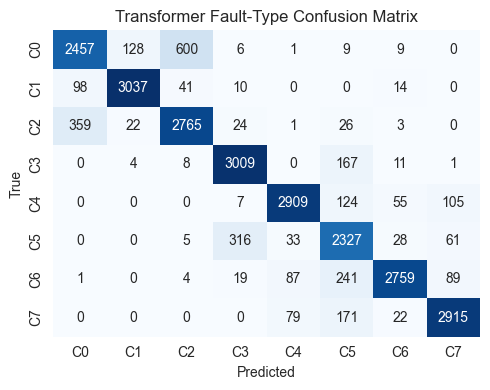

In [54]:
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns

# Gather all predictions and true labels
all_preds_cls = []
all_true_cls = []

tst.eval()
with torch.no_grad():
    for x, y_cls, _ in test_loader:
        x = x.to(device)
        logits, _ = tst(x)
        preds = logits.argmax(dim=1)
        all_preds_cls.extend(preds.cpu().tolist())
        all_true_cls.extend(y_cls.tolist())

# Compute metrics
cm = confusion_matrix(all_true_cls, all_preds_cls)
report = classification_report(all_true_cls, all_preds_cls, digits=3)
print(report)

# Plot confusion matrix
plt.figure(figsize=(5, 4))
sns.heatmap(
    cm,
    annot=True,
    fmt='d',
    cmap='Blues',
    cbar=False,
    xticklabels=[f'C{i}' for i in range(cm.shape[0])],
    yticklabels=[f'C{i}' for i in range(cm.shape[0])]
)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Transformer Fault-Type Confusion Matrix')
plt.tight_layout()
plt.show()


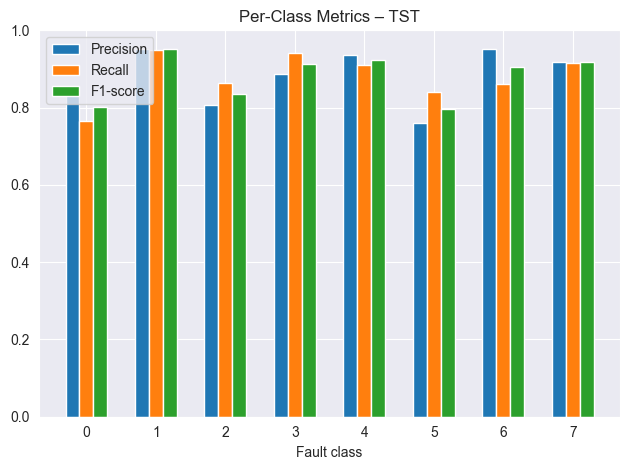

In [55]:
from sklearn.metrics import classification_report, confusion_matrix, precision_recall_fscore_support


# bar chart of precision, recall, F1
prec, rec, f1, _ = precision_recall_fscore_support(all_true_cls, all_preds_cls, zero_division=0)
x = np.arange(n_fault_classes)

plt.figure()
plt.bar(x-0.2, prec, width=0.2, label='Precision')
plt.bar(x,     rec,  width=0.2, label='Recall')
plt.bar(x+0.2, f1,   width=0.2, label='F1-score')
plt.xticks(x)
plt.xlabel('Fault class')
plt.ylim(0, 1)
plt.title('Per-Class Metrics – TST')
plt.legend()
plt.tight_layout()
plt.show()


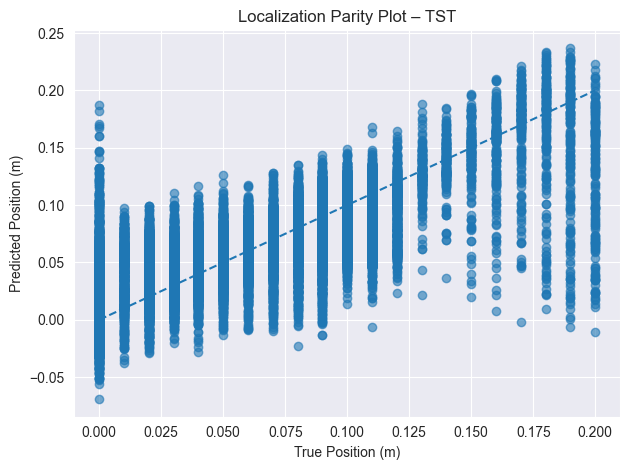

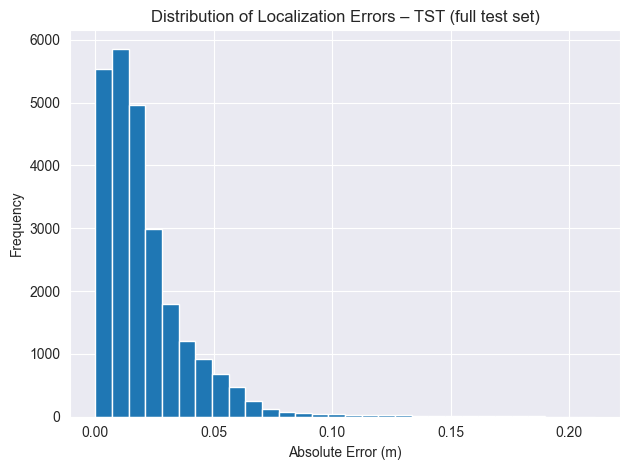

Localization RMSE on full test set: 0.028 m


In [56]:
import torch, matplotlib.pyplot as plt
from torch.utils.data import DataLoader, TensorDataset

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

seq_len = X_test_tensor.shape[1]          # 31
n_classes = 8                             # healthy + 7 faults
tst = TimeSeriesTransformer(seq_len=seq_len,
                            d_model=128,
                            n_heads=4,
                            n_layers=4,
                            dim_feedforward=256,
                            dropout=0.1,
                            n_classes=n_classes).to(device)
tst.load_state_dict(torch.load('../models/best_tst.pt', map_location=device, weights_only=True))
tst.eval()

# 2) Forward-pass on the full test set
test_loader = DataLoader(TensorDataset(X_test_tensor,
                                       y_pos_test_tensor.squeeze(-1)),
                         batch_size=256)

pos_pred, y_pos_true = [], []
with torch.no_grad():
    for xb, yb in test_loader:
        xb = xb.to(device)
        _, p_hat = tst(xb)               # p_hat shape: (B,)
        pos_pred.append(p_hat.cpu())
        y_pos_true.append(yb)

pos_pred   = torch.cat(pos_pred)
y_pos_true = torch.cat(y_pos_true)

# Parity plot
plt.figure()
plt.scatter(y_pos_true, pos_pred, alpha=0.6)
lims = [float(y_pos_true.min()), float(y_pos_true.max())]
plt.plot(lims, lims, linestyle='--')
plt.xlabel('True Position (m)')
plt.ylabel('Predicted Position (m)')
plt.title('Localization Parity Plot – TST')
plt.tight_layout()
plt.show()

# Histogram of absolute errors
abs_err = (pos_pred - y_pos_true).abs()

plt.figure()
plt.hist(abs_err.numpy(), bins=30)
plt.xlabel('Absolute Error (m)')
plt.ylabel('Frequency')
plt.title('Distribution of Localization Errors – TST (full test set)')
plt.tight_layout()
plt.show()

tst_rmse = float(torch.sqrt((abs_err ** 2).mean()))
print(f'Localization RMSE on full test set: {tst_rmse:.3f} m')


### Full Pipeline (GRU-AE to TST):

In [57]:
def gru_ae_detect(tensor, batch_size=64, threshold=0.1):
    if isinstance(tensor, np.ndarray):
        tensor = torch.from_numpy(tensor).float()

    errs = []
    with torch.no_grad():
        for i in range(0, tensor.shape[0], batch_size):
            x = tensor[i:i+batch_size].unsqueeze(1).to(device)
            recon = ae(x)
            # reconstruction error
            err = torch.mean((x - recon) ** 2, dim=(1, 2))
            errs.append(err)

    errs = torch.cat(errs)
    return errs > threshold          # boolean mask

anomaly_mask = gru_ae_detect(X_test, threshold=threshold)
fault_idx = anomaly_mask.nonzero(as_tuple=True)[0]

print(f"Detected {fault_idx.numel()} anomalies out of {X_test.shape[0]} test traces "
      f"({fault_idx.numel() / X_test.shape[0]:.1%}).")

Detected 8606 anomalies out of 25167 test traces (34.2%).


In [58]:
tst.load_state_dict(torch.load('../models/best_tst.pt', map_location=device, weights_only=True))
tst.eval()
fault_idx = fault_idx.cpu()
X_fault = X_test_tensor[fault_idx]
y_class_fault = y_class_test_tensor[fault_idx]
y_pos_fault = y_pos_test_tensor[fault_idx]


fault_loader = DataLoader(TensorDataset(X_fault, y_class_fault, y_pos_fault),
                          batch_size=256)

In [59]:
logits_all, pos_pred_all = [], []
with torch.no_grad():
    for xb, _, _ in fault_loader:
        preds_cls, preds_pos = tst(xb.to(device))
        logits_all.append(preds_cls.cpu())
        pos_pred_all.append(preds_pos.cpu())

y_pred_cls = torch.cat(logits_all).argmax(1)
y_true_cls = y_class_fault
pos_pred   = torch.cat(pos_pred_all)


Visualising the Transformer model's performance:

In [60]:
from sklearn.metrics import classification_report, confusion_matrix, precision_recall_fscore_support
print(classification_report(y_true_cls,
                            y_pred_cls,
                            digits=3,
                            target_names=[f'Class {i}' for i in range(0, int(y_true_cls.max()+1))]))

              precision    recall  f1-score   support

     Class 0      0.791     0.671     0.726       298
     Class 1      0.954     0.952     0.953       434
     Class 2      0.939     0.963     0.951      1410
     Class 3      0.846     0.910     0.877       410
     Class 4      0.987     0.986     0.987      1041
     Class 5      0.911     0.916     0.914       873
     Class 6      0.996     0.974     0.985      1904
     Class 7      0.985     0.992     0.989      2236

    accuracy                          0.958      8606
   macro avg      0.926     0.921     0.923      8606
weighted avg      0.958     0.958     0.958      8606



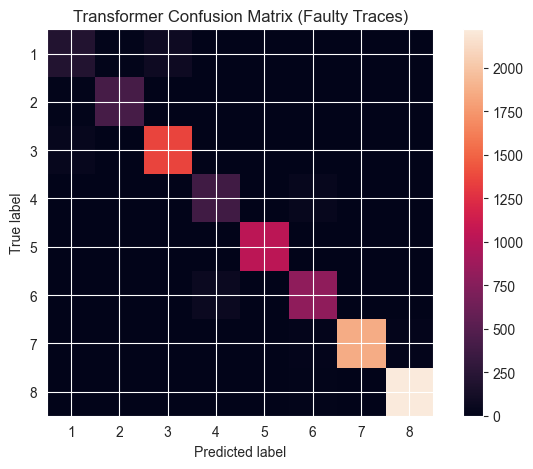

In [61]:
cm = confusion_matrix(y_true_cls, y_pred_cls)
n_fault_classes = cm.shape[0]

plt.figure()
plt.imshow(cm, interpolation='nearest')
plt.title('Transformer Confusion Matrix (Faulty Traces)')
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.colorbar()
tick = np.arange(n_fault_classes)
plt.xticks(tick, tick+1)
plt.yticks(tick, tick+1)
plt.tight_layout()
plt.show()

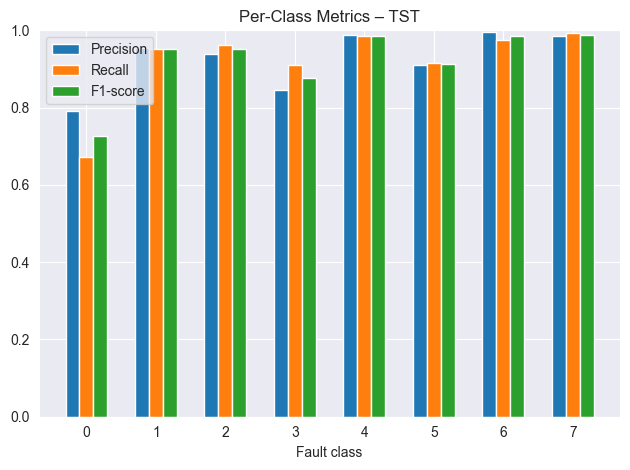

In [62]:
# bar chart of precision, recall, F1
prec, rec, f1, _ = precision_recall_fscore_support(y_true_cls, y_pred_cls, zero_division=0)
x = np.arange(n_fault_classes)

plt.figure()
plt.bar(x-0.2, prec, width=0.2, label='Precision')
plt.bar(x,     rec,  width=0.2, label='Recall')
plt.bar(x+0.2, f1,   width=0.2, label='F1-score')
plt.xticks(x)
plt.xlabel('Fault class')
plt.ylim(0, 1)
plt.title('Per-Class Metrics – TST')
plt.legend()
plt.tight_layout()
plt.show()


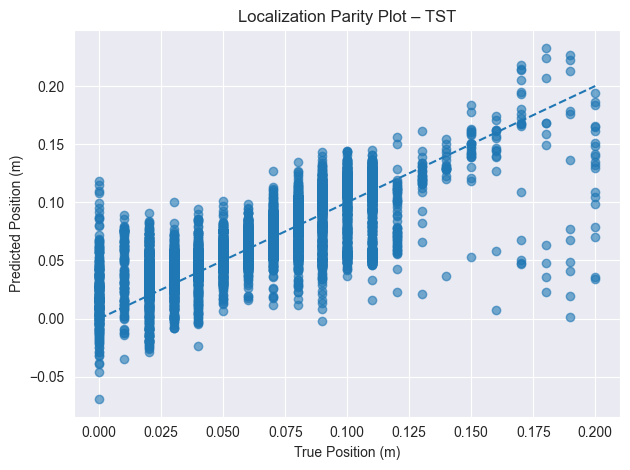

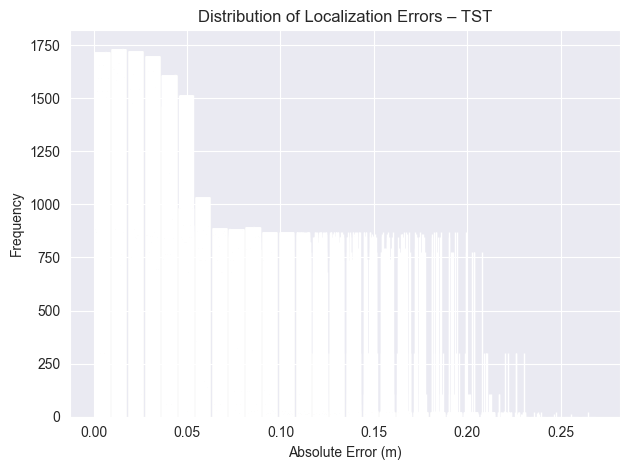

Localization RMSE on detected faults: 0.047 m


In [63]:
# Parity plot
plt.figure()
plt.scatter(y_pos_fault, pos_pred, alpha=0.6)
lims = [float(y_pos_fault.min()), float(y_pos_fault.max())]
plt.plot(lims, lims, linestyle='--')
plt.xlabel('True Position (m)')
plt.ylabel('Predicted Position (m)')
plt.title('Localization Parity Plot – TST')
plt.tight_layout()
plt.show()

# Histogram of absolute errors
abs_err = (pos_pred - y_pos_fault).abs()

plt.figure()
plt.hist(abs_err.numpy(), bins=30)
plt.xlabel('Absolute Error (m)')
plt.ylabel('Frequency')
plt.title('Distribution of Localization Errors – TST')
plt.tight_layout()
plt.show()

rmse = float(torch.sqrt((abs_err**2).mean()))
print(f'Localization RMSE on detected faults: {rmse:.3f} m')


In [64]:
def reconstruction_errors(batch_X, bs=256):
    ae.eval()
    errs = []
    with torch.no_grad():
        for i in range(0, batch_X.size(0), bs):
            chunk = batch_X[i:i+bs]
            x = chunk.unsqueeze(1).to(device)               # (B,1,feat_dim)
            recon = ae(x)
            mse   = (recon - x).pow(2).mean(dim=(1, 2))

            errs.append(mse.cpu())

    return torch.cat(errs)

def detect(batch_X, thresh=threshold):
    return reconstruction_errors(batch_X) > thresh

# Ground-truth vs detected faults
NORMAL_LABEL = 0

gt_fault_mask = (y_class_test_tensor != NORMAL_LABEL)
n_gt_faults   = gt_fault_mask.sum().item()
print(f"Ground-truth faults in test set : {n_gt_faults}")

ae_detect_mask = detect(X_test_tensor)
n_detected     = ae_detect_mask.sum().item()
print(f"Faults flagged by GRU-AE       : {n_detected}")

tp = (gt_fault_mask & ae_detect_mask).sum().item()
fp = (~gt_fault_mask & ae_detect_mask).sum().item()
fn = (gt_fault_mask & ~ae_detect_mask).sum().item()

print(f"TP = {tp}  |  FP = {fp}  |  FN = {fn}")

Ground-truth faults in test set : 21957
Faults flagged by GRU-AE       : 6788
TP = 6664  |  FP = 124  |  FN = 15293


Fault Position RMSE on detected faults only for TCN and TST:

In [65]:
import numpy as np
from sklearn.metrics import mean_squared_error

fault_mask_np = (y_pos_test_tensor.squeeze().cpu().numpy() > 0)

true_pos_tcn = all_true_loc[fault_mask_np]
pred_pos_tcn = all_preds_loc[fault_mask_np]

rmse_tcn = np.sqrt(mean_squared_error(true_pos_tcn, pred_pos_tcn))
print(f'TCN RMSE on faults only : {rmse_tcn:.3f} m')
print(f'TST RMSE on faults only : {tst_rmse:.3f} m') # already calculated before

TCN RMSE on faults only : 0.042 m
TST RMSE on faults only : 0.028 m


## SHAP Analysis on TCN

In [66]:
import numpy as np
import torch.nn as nn
import shap

print("SHAP version:", shap.__version__)          # 0.48.0 expected

SHAP version: 0.48.0


In [67]:
RNG_SEED, BG_SIZE, EXP_SIZE = 0, 256, 128
rng = np.random.default_rng(RNG_SEED)
bg_idx  = rng.choice(len(X_train_tensor), BG_SIZE, replace=False)
exp_idx = rng.choice(len(X_test_tensor),  EXP_SIZE, replace=False)

background = X_train_tensor[bg_idx].cpu()   # (BG, 31)
X_exp      = X_test_tensor[exp_idx].cpu()   # (EXP, 31)
N_EXP, N_FEAT = X_exp.shape

In [68]:
#  frozen wrappers around the  TCN
class TCNClassifier(nn.Module):
    def __init__(self, core):
        super().__init__(); self.core = core.eval().cpu()
        for p in self.core.parameters(): p.requires_grad_(False)
    def forward(self, x):                                # x: (B, 31)
        return self.core(x.unsqueeze(1))[0]              # logits (B, C)

class TCNRegressor(nn.Module):
    def __init__(self, core):
        super().__init__(); self.core = core.eval().cpu()
        for p in self.core.parameters(): p.requires_grad_(False)
    def forward(self, x):
        return self.core(x.unsqueeze(1))[1].unsqueeze(1) # (B, 1)

wrap_cls = TCNClassifier(tcn)
wrap_loc = TCNRegressor(tcn)

N_CLASSES = wrap_cls(background[:1]).shape[1]
print(f"Detected {N_CLASSES} fault classes")

class_names = [f"Fault {i}" for i in range(N_CLASSES)]

Detected 8 fault classes


In [69]:
# SHAP explainers
expl_cls = shap.GradientExplainer(wrap_cls, background, batch_size=64)
expl_loc = shap.GradientExplainer(wrap_loc, background, batch_size=64)

raw_cls = expl_cls.shap_values(
    X_exp,
    ranked_outputs=N_CLASSES,       # int, not list
    output_rank_order="max"
)
raw_loc = expl_loc.shap_values(X_exp)

In [70]:
# 3. unwrap tuple for just the SHAP values
if isinstance(raw_cls, tuple):           # (phi, idx)
    raw_cls = raw_cls[0]
if isinstance(raw_loc, tuple):
    raw_loc = raw_loc[0]

In [71]:
# helper function to fix formatting because i can not figure out what format is going where
def to_list_per_class(vals, n_cls, n_exp, n_feat):
    if isinstance(vals, list) and len(vals) == n_cls:
        return [v[:, :n_feat] for v in vals]

    if isinstance(vals, list) and len(vals) == n_exp:
        a0 = vals[0]
        if a0.shape[0] == n_cls:                      # (C, F′)
            stacked = np.stack(vals, axis=1)          # (C, N, F′)
            return [stacked[i, :, :n_feat] for i in range(n_cls)]
        if a0.shape[-1] == n_cls:                     # (F′, C)
            stacked = np.stack(vals, axis=0)          # (N, F′, C)
            return [stacked[:, :n_feat, i] for i in range(n_cls)]

    if isinstance(vals, np.ndarray) and vals.ndim == 3:
        C, N, F = vals.shape
        # (C, N, F′)
        if C == n_cls and N == n_exp:
            return [vals[i, :, :n_feat] for i in range(n_cls)]
        # (N, C, F′)
        if vals.shape[0] == n_exp and vals.shape[1] == n_cls:
            return [vals[:, i, :n_feat] for i in range(n_cls)]
        # (N, F′, C)
        if vals.shape[0] == n_exp and vals.shape[2] == n_cls:
            return [vals[:, :n_feat, i] for i in range(n_cls)]

    raise RuntimeError(f"Unrecognised SHAP φ format → type: {type(vals)}, "
                       f"shape: {np.shape(vals)}")


cls_vals = to_list_per_class(raw_cls, N_CLASSES, N_EXP, N_FEAT)

# Pad any missing class with zeros
while len(cls_vals) < N_CLASSES:
    cls_vals.append(np.zeros((N_EXP, N_FEAT), dtype=np.float32))

In [72]:
if isinstance(raw_loc, list):
    loc_vals = raw_loc[0]
else:
    loc_vals = raw_loc

loc_vals = loc_vals.reshape(N_EXP, N_FEAT)

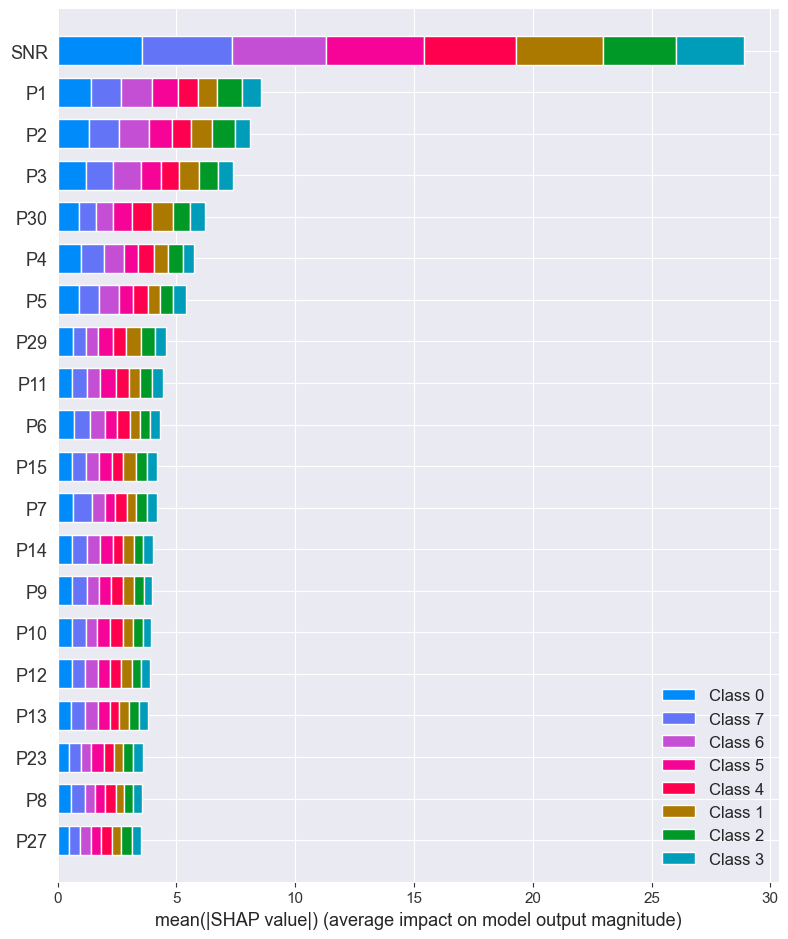

In [73]:
shap.summary_plot(
    cls_vals,
    X_exp.numpy(),
    feature_names=measurement_cols,
    class_names=[f"Class {i}" for i in range(N_CLASSES)],
    show=True
)

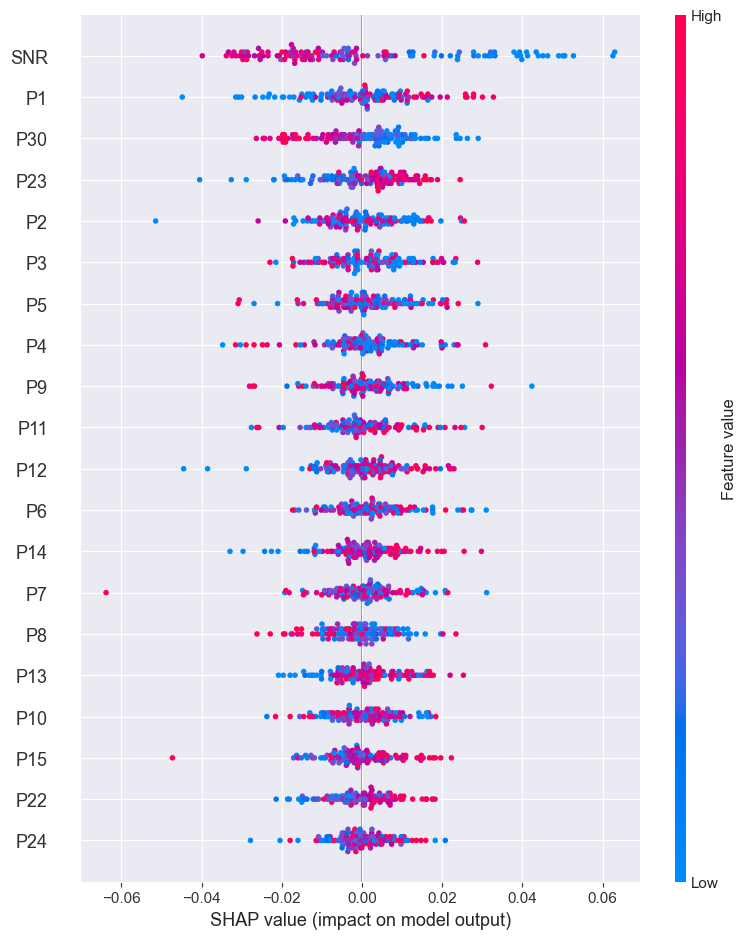

In [74]:
shap.summary_plot(
    loc_vals,
    X_exp.numpy(),
    feature_names=measurement_cols,
    show=True
)

### LLM (ChatGPT o3 model) explanation of SHAP plot:

The SHAP summary reveals a diagnostic model that now pivots chiefly on the global quality indicator of each measurement. **SNR** is by far the most influential feature: higher‐quality traces systematically increase the predicted fault logits, whereas noisy traces pull predictions toward neutrality. This monotonic behaviour mirrors the practical intuition that confident classification is only warranted when the signal exhibits a healthy signal-to-noise ratio.

With distance information removed, the model turns next to the waveform’s boundaries. Amplitude samples at the very start of the trace—**P1, P2, P3**—and at the far end—**P29, P30**—together form the second tier of explanatory power. Elevated reflections in the opening samples tend to nudge the model toward fault types associated with near-end connectors or taps, while strong or attenuated echoes in the closing samples guide it toward faults located deeper in the fibre, such as cuts or bad splices. The clear importance of both edges shows the network has learned to anchor its reasoning on physical reflection patterns rather than on an explicit distance scalar.

Interior points—**P4 through roughly P26**—exert a subtler, fine-tuning influence. Individually they produce only modest SHAP magnitudes, yet their contributions are evenly shared across classes, implying that the dilated convolutions have captured class-specific waveform “textures” distributed throughout the trace. These mid-range features refine the decision once the global SNR and boundary reflections have narrowed the class search space.

Overall, the model now operates with a three-layered logic: (1) assess confidence through SNR; (2) use leading and trailing reflections as primary class cues; (3) refine the verdict through subtle interior-waveform variations. This hierarchy reduces dependence on any single engineered prior, potentially improving generalisation across unseen link topologies, but it also heightens sensitivity to consistent amplitude calibration and temporal alignment in the raw OTDR data.


## Individual Random Samples from TST Pipeline:

In [75]:
import torch.nn.functional as F
import random

MAX_RANGE_M = 0.30                     # metres spanned by one 30-point OTDR window
n_amp = X_fault.shape[1] - 1           # length of amplitude vector (30)

# ---------- GRU-AE reconstruction errors ----------
def recon_err(batch_tensor, batch_size=512):
    errs = []
    with torch.no_grad():
        for i in range(0, batch_tensor.size(0), batch_size):
            xb = batch_tensor[i:i+batch_size].unsqueeze(1).to(device)
            rb = ae(xb)
            mse = (rb - xb).pow(2).mean(dim=(1, 2))
            errs.append(mse.cpu())
    return torch.cat(errs)

rec_errors_fault = recon_err(X_fault)               # (N_fault,)

# ---------- Classification probabilities ----------
probs_fault = F.softmax(torch.cat(logits_all), dim=1)  # (N_fault, n_classes)


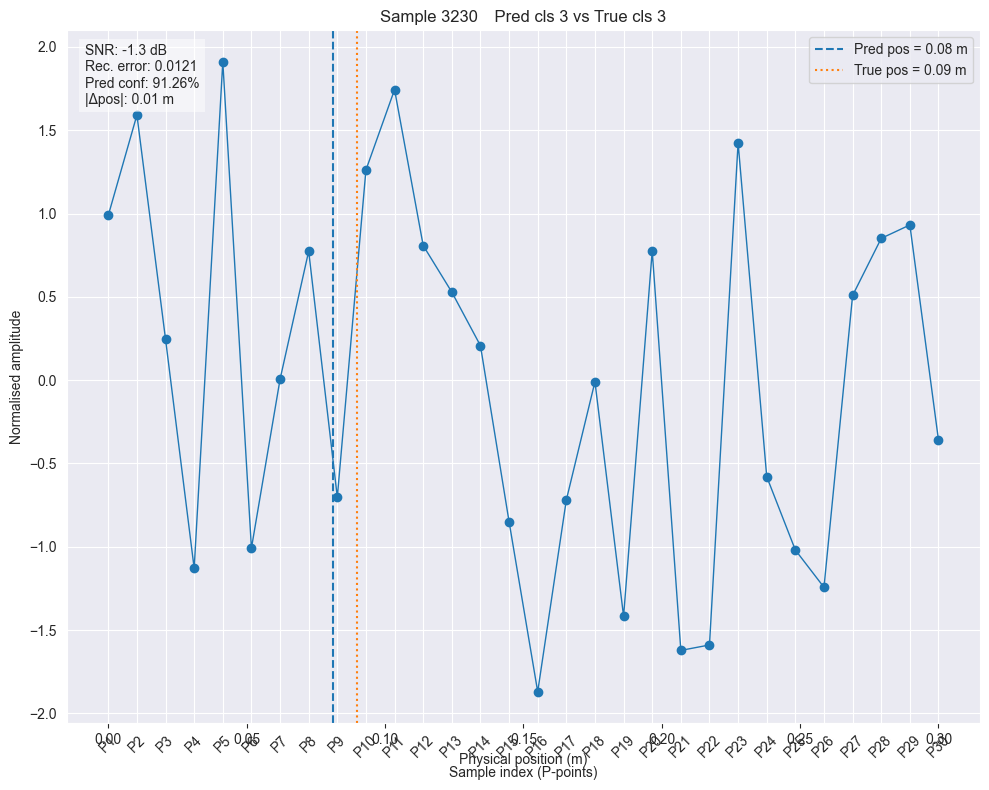

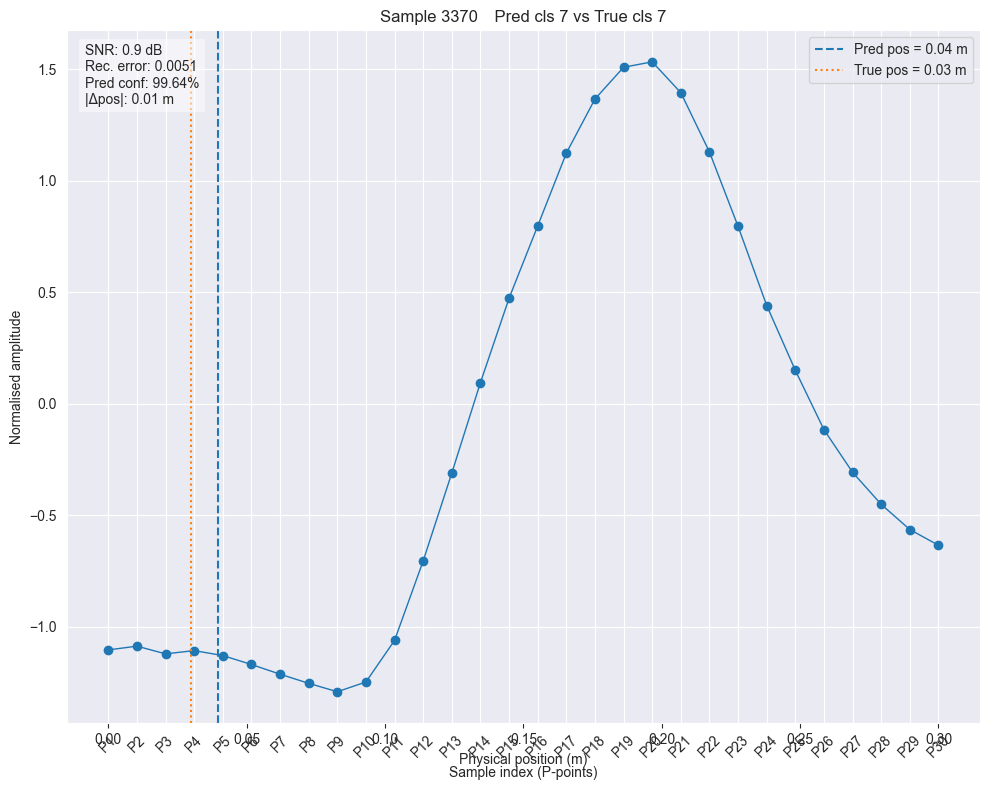

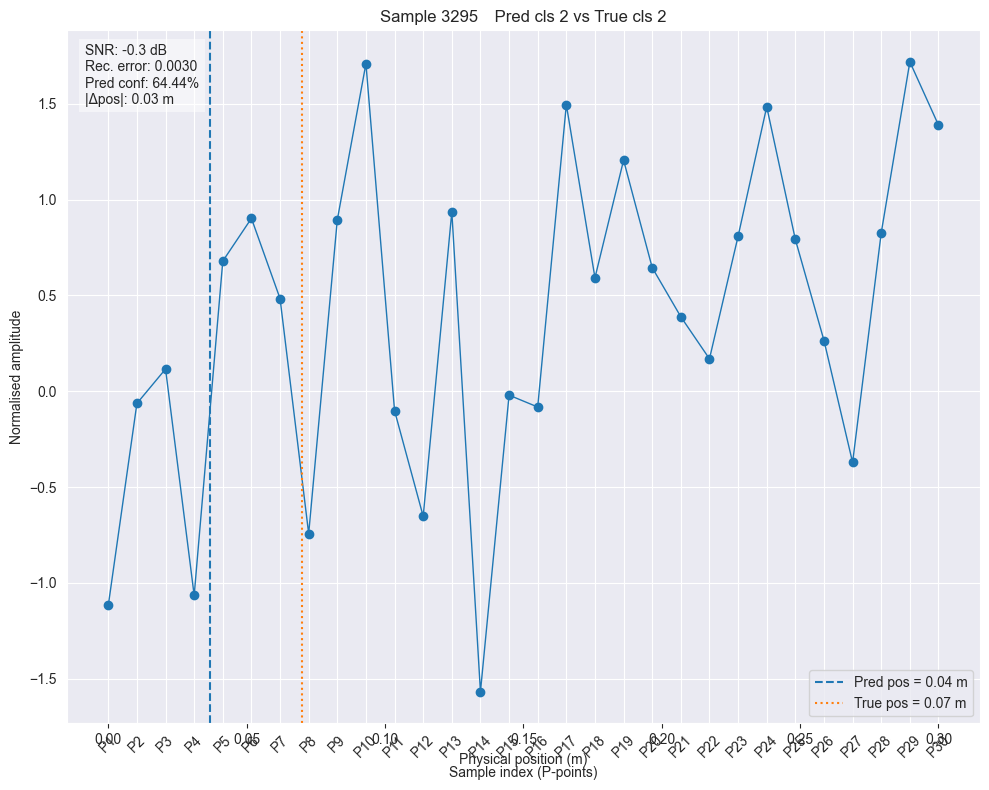

In [79]:
random.seed(58)
num_examples = 3
indices = random.sample(range(X_fault.size(0)), num_examples)

for k, idx in enumerate(indices, 1):
    # -------- data extraction --------
    win          = X_fault[idx].numpy()               # shape (31,)
    amps         = win[:-1]                           # P1 … P30 amplitudes
    snr          = win[-1]
    true_cls     = int(y_true_cls[idx])
    pred_cls     = int(y_pred_cls[idx])
    true_pos_m   = float(y_pos_fault[idx])
    pred_pos_m   = float(pos_pred[idx])
    abs_err_m    = abs(pred_pos_m - true_pos_m)
    rec_err_val  = float(rec_errors_fault[idx])
    pred_conf    = float(probs_fault[idx, pred_cls])

    # ----- convert positions (metres → sample index) -----
    pos_scale = (n_amp - 1) / MAX_RANGE_M            # ≈ 29 / 0.30
    true_pos_idx = true_pos_m * pos_scale
    pred_pos_idx = pred_pos_m * pos_scale

    # -------- plotting --------
    plt.figure(figsize=(10, 8))
    plt.plot(np.arange(n_amp), amps, marker='o', linewidth=1)
    plt.axvline(pred_pos_idx, color='tab:blue', linestyle='--',
                label=f'Pred pos = {pred_pos_m:.2f} m')
    plt.axvline(true_pos_idx, color='tab:orange', linestyle=':',
                label=f'True pos = {true_pos_m:.2f} m')

    # x-axis: keep integer ticks P1 … P30, but show secondary labels in metres
    plt.xticks(range(n_amp), [f'P{p+1}' for p in range(n_amp)], rotation=45)
    sec_ax = plt.gca().secondary_xaxis('bottom',
              functions=(lambda x: x / pos_scale,          # idx → metres
                         lambda m: m * pos_scale))         # metres → idx
    sec_ax.set_xlabel('Physical position (m)')
    sec_ax.set_xlim(plt.gca().get_xlim())

    plt.title(f'Sample {idx} Pred cls {pred_cls} vs True cls {true_cls}')
    plt.xlabel('Sample index (P-points)')
    plt.ylabel('Normalised amplitude')
    plt.legend()

    # ----- textual diagnostics -----
    txt = (
        f"SNR: {snr:.1f} dB\n"
        f"Rec. error: {rec_err_val:.4f}\n"
        f"Pred conf: {pred_conf:.2%}\n"
        f"|Δpos|: {abs_err_m:.2f} m"
    )
    plt.gca().text(0.02, 0.98, txt, va='top', ha='left',
                   transform=plt.gca().transAxes,
                   bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))

    plt.tight_layout()
    plt.show()

### LLM (GPT o3) Explanation:

**Sample 3230 – class 3 “optical tap (eaves-drop)”**
The disturbance is localised ≈ 0.09 m from the window origin and shows as a modest loss without a pronounced Fresnel spike, exactly the signature of a low-reflectance insertion (tap). The SNR is already negative (–1.3 dB), so the moderate attenuation imposed by the tap produces the erratic amplitude swings seen across the window while keeping reflectance close to 0 dB—typical when a short pigtail is fused in to siphon a small fraction of power for monitoring. **Likely cause:** an unauthorised coupler or splitter spliced in the field. **Remedy:** inspect the fibre at the marked location, remove any parasitic device, and re-splice or replace the segment; then certify the link for reflectance and insertion loss to ensure no residual impairment.

---

**Sample 3370 – class 7 “unknown / mixed”**
The fault sits at ≈ 0.03–0.04 m. The trace begins with a shallow loss, then rises smoothly to a rounded crest (+1.5 dB) before decaying—suggesting a composite event: a slight bend-induced attenuation combined with a weakly reflective surface (e.g., a dirty mechanical splice cap that is also under tension). Because neither the loss nor the reflection dominates, the model prudently assigns the mixed catch-all class 7. **Likely causes:** a loosely seated connector plus a gentle macrobend, or an aged splice cassette that has been kinked during maintenance. **Remedy:** open the enclosure at the indicated distance, clean and re-mate the connector or remake the splice, route the fibre with proper bend radius, and repeat an OTDR test to confirm that both excess loss and the broad reflection have disappeared.

---

**Sample 3295 – class 2 “dirty connector”**
The anomaly occurs ≈ 0.07 m down the span and appears primarily as a small reflectance spike with very little associated loss—hallmark of a contaminated or slightly oxidised connector end-face. The extremely low SNR (–0.3 dB) and jagged trace underline how scattered back-reflections from dust or oil disrupt the baseline. **Likely cause:** particulate or film contamination on the ferrule or within the adapter sleeve. **Remedy:** disconnect the patch cord at the highlighted position, clean both male and female sides with lint-free swabs and isopropyl alcohol (or an approved dry-cleaner), inspect with a scope, then reconnect and verify that the reflectance spike has fallen below the noise floor.
